# <font color="red"> deltaNLS VQ1 <font/>
## <font color="green">Codebook Hierarchical Clustering and Feature Spectra<font/>


In [1]:
import os
import sys

import scipy
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
from collections import defaultdict
import warnings

import seaborn as sns
import matplotlib.pyplot as plt

from scipy.spatial.distance import pdist
from scipy.stats import spearmanr, pearsonr

%matplotlib inline
%reload_ext autoreload
%autoreload 2
%aimport
warnings.filterwarnings('ignore')


Modules to reload:
all-except-skipped

Modules to skip:



In [2]:
CYTOSELF_MODEL_PATH = '/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/models_outputs_deltaNLS_tl_neuroself_sep_TDP43/'
EMBEDDINGS_FOLDER = os.path.join(CYTOSELF_MODEL_PATH, 'embeddings', 'deltaNLS', 'vqindhist1')
SAVE_PATH = '/home/labs/hornsteinlab/Collaboration/MOmaps/outputs/figures/deltaNLS'

## Load vqindhist of batch 2&5

In [3]:
vqindhist, labels, paths = [] , [], []
for batch in [2,5]:
    for dataset_type in ['trainset','valset','testset']:
        cur_vqindhist, cur_labels, cur_paths = np.load(os.path.join(EMBEDDINGS_FOLDER, f"batch{batch}_16bit_no_downsample/vqindhist1_{dataset_type}.npy")),\
                np.load(os.path.join(EMBEDDINGS_FOLDER, f"batch{batch}_16bit_no_downsample/vqindhist1_labels_{dataset_type}.npy")),\
                np.load(os.path.join(EMBEDDINGS_FOLDER, f"batch{batch}_16bit_no_downsample/vqindhist1_paths_{dataset_type}.npy"))
        cur_vqindhist = cur_vqindhist.reshape(cur_vqindhist.shape[0], -1)
        vqindhist.append(cur_vqindhist)
        labels.append(cur_labels)
        paths.append(cur_paths)

vqindhist = np.concatenate(vqindhist)
labels = np.concatenate(labels)
paths = np.concatenate(paths)

print(vqindhist.shape, labels.shape)
print(np.unique(labels).shape)

(198121, 2048) (198121,)
(372,)


## Save the histograms in a dataframe (hist_df) and add the label

In [4]:
hist_df = pd.DataFrame(vqindhist)
hist_df['label'] = labels
hist_df['label'] = hist_df['label'].str.replace("_16bit_no_downsample", "")
hist_df['label'] = hist_df['label'].str.replace(os.sep, "_")

def rearrange_string(s):
    parts = s.split('_')
    return f"{parts[4]}_{parts[1]}_{parts[2]}_{parts[0]}_{parts[3]}"

hist_df['label'] = hist_df['label'].apply(rearrange_string)
hist_df_with_path = hist_df.copy()
hist_df_with_path['path'] = paths


hist_df

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,label
0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,FUS_WT_Untreated_batch2_rep2
1,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,3.0,0.0,FUS_WT_Untreated_batch2_rep2
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,FUS_WT_Untreated_batch2_rep2
3,0.0,1.0,3.0,0.0,0.0,3.0,0.0,2.0,0.0,0.0,...,3.0,0.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,CLTC_TDP43_dox_batch2_rep1
4,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,CLTC_TDP43_dox_batch2_rep1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198116,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PURA_TDP43_Untreated_batch5_rep2
198117,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,PURA_TDP43_Untreated_batch5_rep2
198118,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,PURA_TDP43_Untreated_batch5_rep2
198119,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PURA_TDP43_Untreated_batch5_rep2


### SKIP THIS STEP - keep only WT for the cluster calculation step!

In [5]:
# print(hist_df.shape)
# hist_df = hist_df[hist_df.label.str.contains('WT')]
# print(hist_df.shape)
# hist_df

## Average the histograms per each label and save in a new dataframe (mean_spectra_per_marker)

In [6]:
mean_spectra_per_marker = hist_df.groupby('label').mean()
mean_spectra_per_marker

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
label,,,,,,,,,,,,,,,,,,,,,
ANXA11_TDP43_Untreated_batch2_rep1,0.032659,0.118196,1.093313,0.124417,0.884914,0.150855,0.004666,0.068429,0.248834,0.139969,...,0.038880,0.200622,0.651633,0.023328,0.188180,0.004666,0.024883,0.085537,0.051322,0.017107
ANXA11_TDP43_Untreated_batch2_rep2,0.043299,0.121649,1.105155,0.117526,0.591753,0.175258,0.004124,0.057732,0.160825,0.098969,...,0.043299,0.220619,0.610309,0.022680,0.144330,0.012371,0.030928,0.127835,0.043299,0.008247
ANXA11_TDP43_Untreated_batch5_rep1,0.032815,0.183074,2.056995,0.243523,0.685665,0.157168,0.006908,0.170984,0.253886,0.151986,...,0.072539,0.117444,0.768566,0.063903,0.227979,0.001727,0.044905,0.215889,0.062176,0.020725
ANXA11_TDP43_Untreated_batch5_rep2,0.022222,0.214141,1.585859,0.278788,0.775758,0.236364,0.006061,0.159596,0.270707,0.193939,...,0.072727,0.107071,0.769697,0.054545,0.206061,0.004040,0.028283,0.195960,0.070707,0.018182
ANXA11_TDP43_dox_batch2_rep1,0.032423,0.102389,1.092150,0.131399,0.610922,0.165529,0.006826,0.029010,0.168942,0.087031,...,0.035836,0.230375,0.418089,0.011945,0.134812,0.005119,0.037543,0.163823,0.068259,0.032423
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mitotracker_TDP43_dox_batch5_rep2,0.112516,0.115044,0.730721,0.151707,0.284450,0.164349,0.003793,0.522124,0.049305,0.508217,...,0.032870,0.271808,0.083439,0.017699,0.192162,0.003793,0.018963,0.189633,0.070796,0.020228
mitotracker_WT_Untreated_batch2_rep1,0.064615,0.209231,1.270769,0.169231,0.129231,0.184615,0.024615,0.596923,0.012308,0.424615,...,0.036923,0.083077,0.123077,0.046154,0.221538,0.000000,0.175385,0.104615,0.036923,0.000000
mitotracker_WT_Untreated_batch2_rep2,0.084469,0.174387,1.215259,0.217984,0.141689,0.152589,0.008174,0.525886,0.016349,0.258856,...,0.043597,0.128065,0.098093,0.062670,0.239782,0.002725,0.144414,0.095368,0.008174,0.005450


## Correlate the indices histograms

In [7]:
corr = mean_spectra_per_marker.corr()
corr

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
0,1.000000,-0.155484,-0.273537,-0.259091,0.049673,-0.117201,-0.007113,-0.073465,-0.341577,-0.236341,...,-0.094396,0.536261,0.106268,-0.322455,-0.321564,0.125625,-0.039967,-0.180824,0.562913,0.004961
1,-0.155484,1.000000,0.231562,0.388467,-0.327508,0.457108,-0.088781,0.076838,0.272867,0.238481,...,0.297490,0.264889,-0.353040,0.143745,0.141496,0.014188,-0.041556,0.222577,-0.221118,0.392912
2,-0.273537,0.231562,1.000000,0.180939,-0.350737,0.277862,-0.068104,0.194068,0.402429,0.122987,...,0.354371,-0.082225,-0.199171,-0.010126,0.010337,-0.270648,0.124352,0.274646,-0.033250,-0.176542
3,-0.259091,0.388467,0.180939,1.000000,-0.143052,0.586477,-0.054350,0.430077,0.192405,0.073937,...,0.336814,0.001232,-0.303807,0.075204,0.133364,-0.169079,0.053126,0.393482,-0.263036,0.513954
4,0.049673,-0.327508,-0.350737,-0.143052,1.000000,-0.420285,-0.335078,-0.364683,-0.032245,-0.403816,...,-0.392796,-0.423854,0.544982,0.140696,-0.002021,0.185985,-0.393821,-0.309773,-0.144579,0.005663
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2043,0.125625,0.014188,-0.270648,-0.169079,0.185985,-0.212783,-0.093154,-0.235843,-0.140823,-0.153704,...,-0.237104,0.064204,-0.085939,-0.003024,0.098294,1.000000,-0.139009,-0.100785,-0.108649,-0.050367
2044,-0.039967,-0.041556,0.124352,0.053126,-0.393821,0.188796,0.558980,0.494171,-0.264656,0.231393,...,0.085016,0.169124,-0.292142,-0.313982,-0.285528,-0.139009,1.000000,0.201185,0.001473,-0.166415
2045,-0.180824,0.222577,0.274646,0.393482,-0.309773,0.353118,0.309534,0.457101,0.135804,0.519374,...,0.415436,0.196190,-0.491221,-0.174665,0.059721,-0.100785,0.201185,1.000000,-0.094706,0.418701
2046,0.562913,-0.221118,-0.033250,-0.263036,-0.144579,0.118362,0.008507,-0.074911,-0.303425,-0.253187,...,0.100688,0.463358,-0.029215,-0.300784,-0.300114,-0.108649,0.001473,-0.094706,1.000000,-0.111400


## Plot correlation heatmap

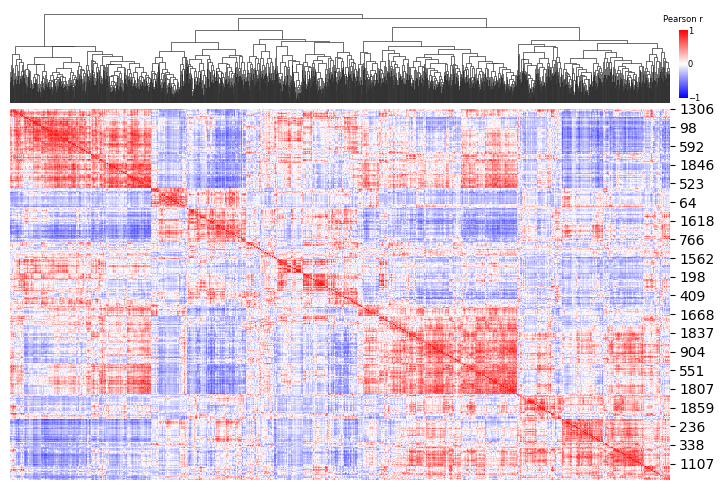

In [8]:
kws = dict(cbar_kws=dict(ticks=[-1,0,1]))
clustermap = sns.clustermap(corr, center=0, cmap='bwr', vmin=-1, vmax=1, figsize=(9,5), xticklabels=False, **kws)
clustermap.ax_row_dendrogram.set_visible(False)
clustermap.ax_cbar.set_position([clustermap.ax_col_dendrogram.get_position().x1+0.01, # x location 
                                 clustermap.ax_col_dendrogram.get_position().y0+0.01, # y location
                                 0.01,                                                # width
                                 clustermap.ax_col_dendrogram.get_position().height-0.05]) #height
clustermap.ax_cbar.set_title('Pearson r',fontsize=6)
clustermap.cax.tick_params(axis='y', labelsize=6, length=0, pad=0.1) 
plt.show()

clustermap.figure.savefig(os.path.join(SAVE_PATH, "deltaNLS_codeword_idx_corr_heatmap.png"))

## Cut the dendrogram to get indices clusters

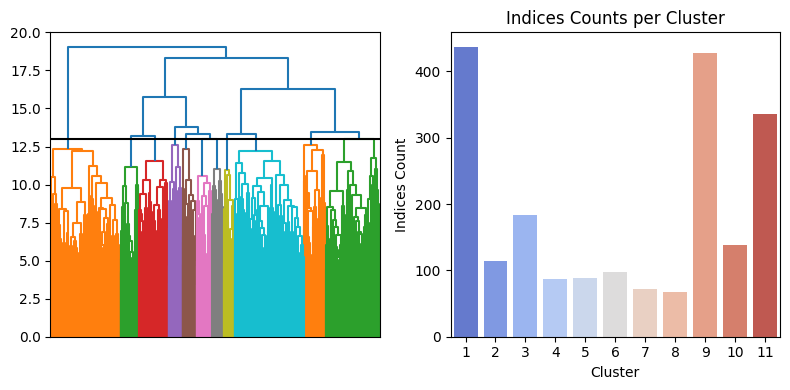

In [9]:
def get_clusters(clustermap, corr, cutoff = 14.2):
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(8,4))
    den = scipy.cluster.hierarchy.dendrogram(clustermap.dendrogram_col.linkage,
                                             labels = corr.index,
                                             color_threshold=cutoff,
                                             no_labels=True,
                                             ax=axs[0])
    axs[0].axhline(cutoff, c='black', linestyle="-")
    #return den
    
    def get_cluster_classes(den):
        cluster_classes = defaultdict(list)
        seen = []
        cur_cluster = 1
        last_color = den['leaves_color_list'][0]
        for label, color in zip(den['ivl'], den['leaves_color_list']):
            if color != last_color:
                cur_cluster += 1
                last_color = color
            cluster_classes[cur_cluster].append(label)     
        return cluster_classes

    clusters = get_cluster_classes(den)
    cluster = []
    corr_with_clusters = corr.copy()

    for i in corr_with_clusters.index:
        included=False
        for j in clusters.keys():
            if i in clusters[j]:
                cluster.append(j)
                included=True
        if not included:
            cluster.append(None)

    corr_with_clusters["cluster"] = cluster

    # visualize the cluster counts
    sns.countplot(data=corr_with_clusters.sort_values(by='cluster'), x='cluster', palette='coolwarm', ax=axs[1])

    # Add labels and title
    axs[1].set_xlabel('Cluster')
    axs[1].set_ylabel('Indices Count')
    axs[1].set_title('Indices Counts per Cluster')

    plt.tight_layout()
    # Show
    plt.show()
    corr_with_clusters['cluster'] = corr_with_clusters['cluster'].astype(str)
    corr_with_clusters['cluster'] = 'C' + corr_with_clusters['cluster']
    return corr_with_clusters

corr_with_clusters = get_clusters(clustermap, corr, cutoff = 13)

In [10]:
#corr_with_clusters = get_clusters(clustermap, corr, cutoff = 14)

## Find representative images per cluster

/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch5_16bit_no_downsample/WT/Untreated/KIFC1/rep1_R11_w3confCy5_s434_panelL_WT_processed.npy_6
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch5_16bit_no_downsample/TDP43/dox/PML/rep1_R11_w2confmCherry_s231_panelM_TDP43_processed.npy_4
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch5_16bit_no_downsample/WT/Untreated/NEMO/rep1_R11_w2confmCherry_s480_panelL_WT_processed.npy_0
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch5_16bit_no_downsample/WT/Untreated/NEMO/rep1_R11_w2confmCherry_s456_panelL_WT_processed.npy_0
/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/processed/spd2/SpinningDisk/deltaNLS/batch5_16bit_no_downsample/WT/Untreated/Tubulin/rep1_R11_w4confGFP_s489_panelB_WT_processed.npy_1
/home/labs/hornsteinlab/Collaborati

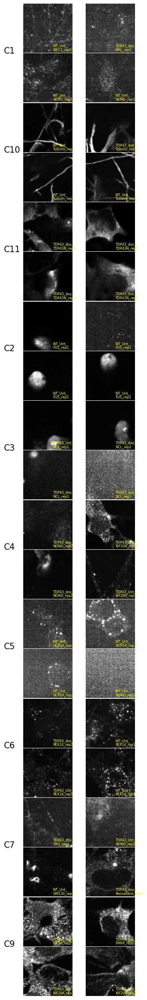

In [11]:
clusters = np.unique(corr_with_clusters.cluster)
hist_per_cluster = pd.DataFrame(index = hist_df_with_path.index, columns = list(clusters) + ['label','path'])
hist_per_cluster.label = hist_df_with_path.label
hist_per_cluster.path = hist_df_with_path.path

# for each cluster, get the indices and calc the sum of the histogram
for cluster_label, cluster_group in corr_with_clusters.groupby('cluster'):
    hist_per_cluster[cluster_label] = hist_df_with_path[cluster_group.index].sum(axis=1) / 625
    
hist_per_cluster['max_cluster'] = hist_per_cluster.idxmax(axis=1, numeric_only=True)
fig, axs = plt.subplots(nrows=2*np.unique(hist_per_cluster.max_cluster).size, ncols=2, figsize=(4,32))

unique_markers = np.unique(hist_per_cluster.label.str.split("_").str[0])
unique_cell_lines =  np.unique(hist_per_cluster.label.str.split("_").str[1])
unique_conditions =  np.unique(hist_per_cluster.label.str.split("_").str[2])
color_light_green = '#8DF980'
color_gray = 'gray'

unique_label_per_clusters = {}
unique_marker_per_clusters = pd.DataFrame(color_gray, columns=clusters, index=unique_markers)
unique_cell_lines_per_clusters = pd.DataFrame(color_gray,columns=clusters, index=unique_cell_lines)
unique_conditions_per_clusters = pd.DataFrame(color_gray,columns=clusters, index=unique_conditions)

for i, (max_cluster, max_cluster_group) in enumerate(hist_per_cluster.groupby('max_cluster')):
    max_cluster_group_thres = max_cluster_group[max_cluster_group[max_cluster] >= 0.5]
    unique_label_per_clusters[max_cluster] = np.unique(max_cluster_group_thres.label)
    unique_marker_per_clusters.loc[np.unique(max_cluster_group_thres.label.str.split("_").str[0]), max_cluster] = color_light_green
    unique_cell_lines_per_clusters.loc[np.unique(max_cluster_group_thres.label.str.split("_").str[1]), max_cluster]  = color_light_green
    unique_conditions_per_clusters.loc[np.unique(max_cluster_group_thres.label.str.split("_").str[2]), max_cluster]  = color_light_green
    max_tiles_paths = max_cluster_group[[max_cluster,'path']].sort_values(by=max_cluster,ascending=False)[:4].path
    for j, tile_path in enumerate(max_tiles_paths):

        cut = tile_path.rfind("_")
        real_path = tile_path[:cut]
        tile_number = int(tile_path[cut+1:])
        cur_site = np.load(real_path)
        ax = axs[i * 2 + j // 2, j%2]
        ax.imshow(cur_site[tile_number,:,:,0], cmap='gray', vmin=0, vmax=1)
        ax.axis('off')
        if j==0:
            ax.text(-40,100, max_cluster, fontsize=15)
        split_path=real_path.split(os.sep)
        marker = split_path[-2]
        condition = split_path[-3]
        if 'Untreated' in condition:
            condition = condition[:3]
        cell_line = split_path[-4]
        if 'FUS' in cell_line:
            cell_line = cell_line[:6]
        rep = split_path[-1].split("_")[0]
        label = f"{cell_line}_{condition}_\n{marker}_{rep}"
        ax.text(60,95,label, color='yellow', fontsize=6)
    
plt.subplots_adjust(wspace=0.01, hspace=0.01)
# Save the figure to file
plt.savefig(os.path.join(SAVE_PATH, "deltaNLS_representative_images_per_cluster.png"), bbox_inches='tight')
plt.show()



0 1228 419.49254512786865


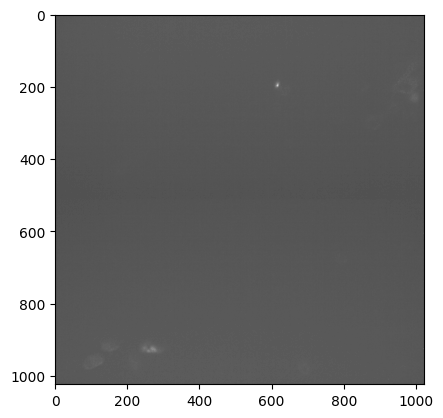

In [9]:
import matplotlib.pyplot as plt
import skimage
tiff_file='/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch2/WT/panelK/Untreated/rep2/Rab5/R11_w3confCy5_s581.tif'
# _tiff_file='/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch2/WT/panelK/Untreated/rep2/Rab5/R11_w3confCy5_s581.tif'
# _tiff_file='/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch2/WT/panelK/Untreated/rep2/NONO/R11_w2confmCherry_s581.tif'
tiff_file='/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch2/WT/panelK/Untreated/rep2/NONO/R11_w2confmCherry_s582.tif'

# _tiff_file = '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch2/TDP43/panelG/dox/rep1/NCL/R11_w3confCy5_s242.tif'
# _tiff_file = '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch5/TDP43/panelG/dox/rep1/NCL/R11_w3confCy5_s259.tif'
# _tiff_file = '/home/labs/hornsteinlab/Collaboration/MOmaps/input/images/raw/SpinningDisk/deltaNLS_sort/batch5/TDP43/panelG/dox/rep1/NCL/R11_w3confCy5_s292.tif'
img = plt.imread(tiff_file)
plt.imshow(img, cmap='gray')
print(img.min(),img.max(),img.mean())


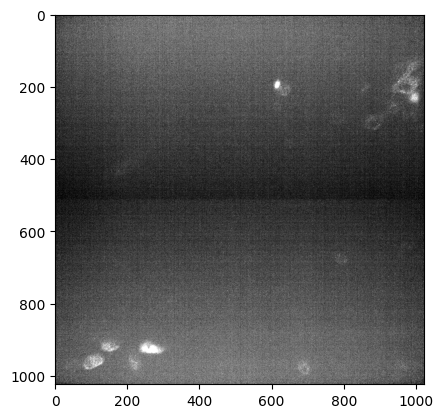

In [10]:
# Scale
vmin, vmax = np.percentile(img, q=(0.5, 99.9))

img_scaled1 = skimage.exposure.rescale_intensity(
    img,
    in_range=(vmin, vmax),
    out_range=np.float32
)
plt.imshow(img_scaled1, cmap='gray', vmin=0, vmax=1)
# plt.imshow(img_scaled1[150:250, 350:450], cmap='rainbow', vmin=0, vmax=1)
# #plt.imshow(img_scaled1[400:600, 400:600], cmap='rainbow', vmin=0, vmax=1)
# plt.imshow(img_scaled1[150:250, 150:250], cmap='rainbow', vmin=0, vmax=1)
# print(img_scaled1.min(),img_scaled1.max(),img_scaled1.mean(), img_scaled1.std())

# snr = img_scaled1[400:600, 400:600].mean()/img_scaled1[400:600, 400:600].std()
# np.log10(snr)*20

# from skimage.measure import shannon_entropy
# print(f"shannon_entropy tile {shannon_entropy(img_scaled1[400:600, 400:600])}")
# print(f"shannon_entropy tile {shannon_entropy(img_scaled1[100:200, 100:200])}")
# print(f"shannon_entropy tile {shannon_entropy(img_scaled1[150:250, 350:450])}")

# print(f"shannon_entropy all {shannon_entropy(img_scaled1)}")


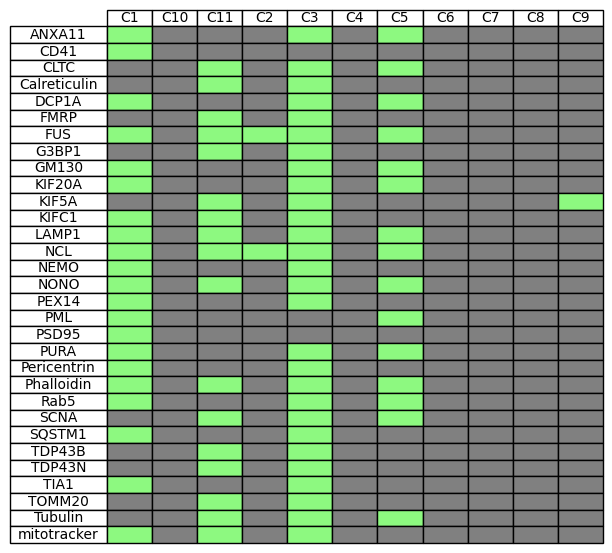

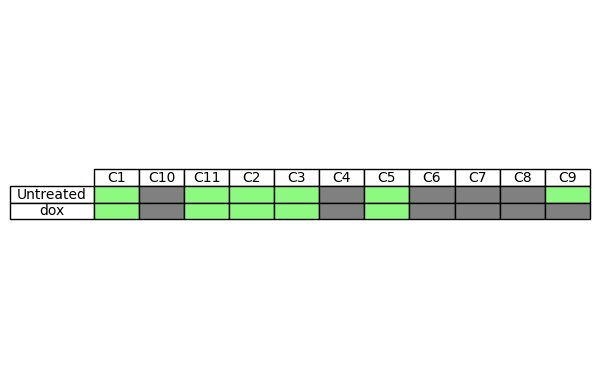

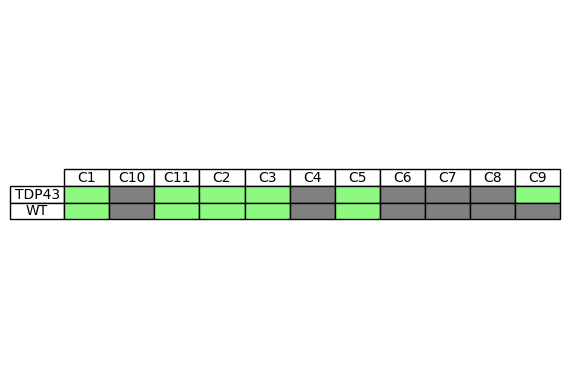

In [12]:


for df in [unique_marker_per_clusters,unique_conditions_per_clusters,unique_cell_lines_per_clusters]:

    fig, ax = plt.subplots()
    table = ax.table(rowLabels=df.index,
             colLabels=df.columns,
             cellLoc='center',
             rowLoc='center',
             loc='center',
             cellColours=df.values)

    plt.axis('off')
    plt.show()

## Load other batches vqindhists

In [13]:
vqindhist_inference, labels_inference, paths_inference = [] , [], []
for batch in [3,4]:
    for dataset_type in ['all']:
        cur_vqindhist, cur_labels, cur_paths = np.load(os.path.join(EMBEDDINGS_FOLDER, f"batch{batch}_16bit_no_downsample/vqindhist1_{dataset_type}.npy")),\
                np.load(os.path.join(EMBEDDINGS_FOLDER, f"batch{batch}_16bit_no_downsample/vqindhist1_labels_{dataset_type}.npy")),\
                np.load(os.path.join(EMBEDDINGS_FOLDER, f"batch{batch}_16bit_no_downsample/vqindhist1_paths_{dataset_type}.npy"))
        cur_vqindhist = cur_vqindhist.reshape(cur_vqindhist.shape[0], -1)
        vqindhist_inference.append(cur_vqindhist)
        labels_inference.append(cur_labels)
        paths_inference.append(cur_paths)


In [14]:
# Add batches that were used in training as well        
vqindhist_inference.append(vqindhist)
labels_inference.append(labels)
paths_inference.append(paths)

vqindhist_inference = np.concatenate(vqindhist_inference)
labels_inference = np.concatenate(labels_inference)
paths_inference = np.concatenate(paths_inference)

print(vqindhist_inference.shape, labels_inference.shape)
print(np.unique(labels_inference).shape)

(404133, 2048) (404133,)
(730,)


In [15]:
# Generate DataFrame
hist_df_inference = pd.DataFrame(vqindhist_inference)
hist_df_inference['label'] = labels_inference
hist_df_inference['label'] = hist_df_inference['label'].str.replace("_16bit_no_downsample", "")
hist_df_inference['label'] = hist_df_inference['label'].str.replace(os.sep, "_")

def rearrange_string(s):
    parts = s.split('_')
    return f"{parts[4]}_{parts[1]}_{parts[2]}_{parts[0]}_{parts[3]}"

hist_df_inference['label'] = hist_df_inference['label'].apply(rearrange_string)
hist_df_inference

,0,1,2,3,4,5,6,7,8,9,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,label
0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,KIF5A_WT_Untreated_batch3_rep1
1,0.0,0.0,2.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,KIF5A_WT_Untreated_batch3_rep1
2,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,3.0,0.0,0.0,0.0,KIF5A_WT_Untreated_batch3_rep1
3,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,KIF5A_WT_Untreated_batch3_rep1
4,0.0,0.0,6.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,SQSTM1_TDP43_dox_batch3_rep1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
404128,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PURA_TDP43_Untreated_batch5_rep2
404129,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,PURA_TDP43_Untreated_batch5_rep2
404130,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,PURA_TDP43_Untreated_batch5_rep2
404131,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,...,0.0,4.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,PURA_TDP43_Untreated_batch5_rep2


## plot the heatmaps with clusters and histograms of wanted labels

In [16]:
def plot_heatmap_with_clusters_and_histograms(corr_with_clusters, hist_df, labels, 
                                              sep = "_", colormap_name = "viridis", 
                                              filename="deltaNLS_plot_heatmap_with_clusters_and_histograms.png"):
    # create the heatmap and dendrogram
    kws = dict(cbar_kws=dict(ticks=[-1,0,1]))
    clustermap = sns.clustermap(corr, center=0, cmap='bwr', vmin=-1, vmax=1, figsize=(9,5), xticklabels=False, yticklabels=False, col_colors=corr_with_clusters.cluster, **kws)
    clustermap.ax_row_dendrogram.set_visible(False)

    # get the indices order from the dendrogram 
    hierarchical_order = clustermap.dendrogram_col.reordered_ind
    
    # prepare labels and filter histograms of wanted labels
    real_labels = []
    for label in labels:
        if label not in np.unique(hist_df.label):
            real_labels += [real_label for real_label in np.unique(hist_df.label) if label in real_label]
        else:
            real_labels.append(label)
    hist_df_cur = hist_df[hist_df.label.isin(real_labels)]
    cur_groups = real_labels
    splitted_labels = hist_df_cur.label.str.split(sep)
    cur_batches = np.unique(splitted_labels.str[-2])
    cur_markers = np.unique(splitted_labels.str[-5])
    cur_cell_lines = np.unique(splitted_labels.str[-4])
    cur_conditions = np.unique(splitted_labels.str[-3])
    cur_reps =  np.unique(splitted_labels.str[-1])
    # Mean the histograms by labels and re-order by the indices order
    total_spectra_per_marker_ordered = hist_df_cur.groupby('label').mean()[hierarchical_order] #TODO: change to mean?

    # calc clusters locations
    #cluster_counts = pd.DataFrame(corr_with_clusters.cluster.value_counts()).reset_index().sort_values(by='cluster')
    cluster_counts = pd.DataFrame(corr_with_clusters.cluster.value_counts()).reset_index()#
    cluster_counts.cluster = cluster_counts.cluster.str.replace('C','').astype('int')
    cluster_counts.sort_values(by='cluster', inplace=True)
    cluster_positions = clustermap.ax_col_dendrogram.get_position()
    num_samples = len(clustermap.dendrogram_col.data)
    line_positions = [cluster_positions.x0 + i * (cluster_positions.width / num_samples) for i in range(1, num_samples)]

    # make room for the histograms in the plot
    hist_height = 0.05
    clustermap.fig.subplots_adjust(top=hist_height*len(cur_groups)+1, bottom=hist_height*len(cur_groups))

    # add axes for the histograms
    axs=[]
    for i, label in enumerate(cur_groups):
        axs.append(clustermap.fig.add_axes([clustermap.ax_heatmap.get_position().x0, 0+i*hist_height, clustermap.ax_heatmap.get_position().width, hist_height]))

    # create colors
    colors = sns.color_palette(colormap_name, n_colors=len(cur_groups))

    # plot the histograms
    for i, label in enumerate(cur_groups[::-1]):
        d = total_spectra_per_marker_ordered.loc[label, :]
        axs[i].fill_between(range(len(d)), d, color=colors[i], label=label, linewidth=1)
        axs[i].set_xticklabels([])
        axs[i].set_xticks([])
        axs[i].set_yticklabels([])
        axs[i].set_yticks([])
        axs[i].tick_params(axis='y', labelsize=4, length=0, pad=0.1)
        splitted_label = label.split(sep)
        label_for_plot = ''
        if len(cur_cell_lines)>1:
            label_for_plot+= f'{splitted_label[-4]}_'        
        if len(cur_conditions)>1:
            label_for_plot+= f'{splitted_label[-3]}_'  
        if len(cur_markers)>1:
            label_for_plot+= f'{splitted_label[-5]}_'
        if len(cur_batches)>1:
            label_for_plot+= f'{splitted_label[-2]}_'
        if len(cur_reps)>1:
            label_for_plot+= f'{splitted_label[-1]}'
        if label_for_plot.endswith("_"):
            label_for_plot = label_for_plot[:-1]
        axs[i].text(1.02, 0.5, label_for_plot, transform=axs[i].transAxes,
                    rotation=0, va='center', ha='left')
        # add cluster lines to histograms
        prev_count = 0
        for j, cluster in enumerate(cluster_counts.cluster):
            cur_count = cluster_counts.iloc[j]['count']
            cluster_end = cur_count + prev_count
            axs[i].axvline(x=cluster_end, color='black',linestyle="--", linewidth=0.4)
            prev_count = cluster_end

        #ax.tick_params(axis='y', labelsize=8)
        axs[i].spines['bottom'].set_color('lightgray')
        axs[i].spines['top'].set_color('lightgray')
        axs[i].spines['right'].set_color('lightgray')
        axs[i].spines['left'].set_color('lightgray')
        axs[i].margins(x=0)

    # fix the cbar appearance 
    clustermap.ax_cbar.set_position([clustermap.ax_col_dendrogram.get_position().x1+0.01, # x location 
                                     clustermap.ax_col_dendrogram.get_position().y0+0.01, # y location
                                     0.01,                                                # width
                                     clustermap.ax_col_dendrogram.get_position().height-0.05]) #height
    clustermap.ax_cbar.set_title('Pearson r',fontsize=6)
    clustermap.cax.tick_params(axis='y', labelsize=6, length=0, pad=0.1)
   
    # add cluster lines to the heatmap
    prev_count = 0
    for j, cluster in enumerate(cluster_counts.cluster):
        cur_count = cluster_counts.iloc[j]['count']
        cluster_end = cur_count + prev_count
        clustermap.ax_heatmap.axvline(x=cluster_end, color='black',linestyle="--", linewidth=0.4)
        clustermap.ax_col_colors.text(x=cluster_end-(cur_count/2), y=0.5, s=cluster, fontsize=6)
        prev_count = cluster_end

    clustermap.figure.savefig(os.path.join(SAVE_PATH, filename), bbox_inches='tight')
    return None

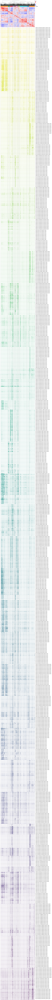

In [17]:
plot_heatmap_with_clusters_and_histograms(corr_with_clusters, hist_df_inference, labels=['_'],
                                         filename="deltaNLS_plot_heatmap_with_clusters_and_histograms.png")

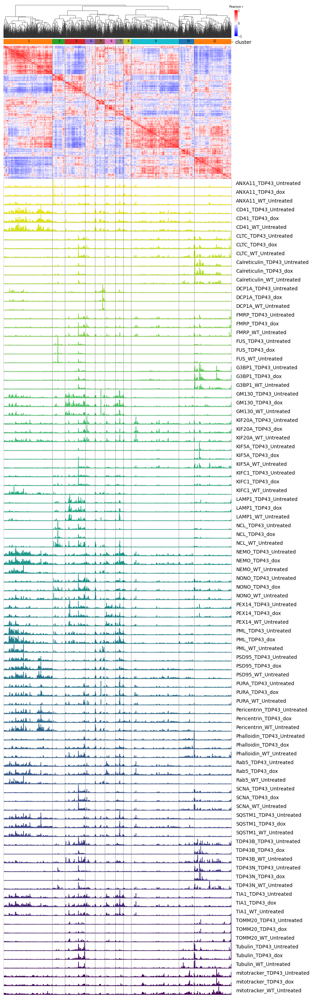

In [18]:
# Merge batches
hist_df_inference_merged = hist_df_inference.copy()
hist_df_inference_merged['label'] = hist_df_inference_merged['label'].str.split("_").str[0:3].apply(lambda x: '_'.join(x))

plot_heatmap_with_clusters_and_histograms(corr_with_clusters, 
                                          hist_df_inference_merged, 
                                          labels=['_'],
                                          filename="deltaNLS_plot_heatmap_with_clusters_and_histograms_merged_batches.png")

In [19]:
# batches_inference = hist_df_inference[hist_df_inference.label.str.contains(r'batch3|batch4', regex=True)]
# batches_inference = batches_inference[batches_inference.label.str.contains('WT')]
# batches_inference = batches_inference.copy()
# batches_inference['label'] = batches_inference['label'].str.split("_").str[0:3].apply(lambda x: '_'.join(x))


In [20]:
# batches_test_agg

In [21]:
# plot_heatmap_with_clusters_and_histograms(corr_with_clusters, batches_test_agg, labels = ['FMRP','PML','G3BP1',
#                                                                                    'PURA','TOMM20','SQSTM1','mitotracker',
#                                                                                    'TDP43','PSD95','DCP1A'])

In [22]:
print("Done!")

Done!
